<a href="https://colab.research.google.com/github/JasmineNasywa/PCVK_Ganjil_2026/blob/main/Week3_08.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# ===== SEL IDENTITAS - JANGAN DIHAPUS, HARUS SEL PERTAMA =====
import sys, platform, hashlib, datetime, zoneinfo

NAMA = 'Jasmine Nasywa Nabilah'
NIM = '244107020119'

N = int(NIM[-3:])
PARAM = {
'b' : (N % 61) + 20,
'a' : round(1.0 + (N % 9) / 10, 1),
'c' : (N % 20) + 30,
'gamma': round(0.4 + (N % 6) * 0.25, 2),
'bit' : (N % 6) + 2,
}
waktu = datetime.datetime.now(zoneinfo.ZoneInfo('Asia/Jakarta'))
print('NAMA :', NAMA)
print('NIM :', NIM, '| N =', N)
for k, v in PARAM.items():
  print('%-6s :' % k, v)
print('WAKTU :', waktu.strftime('%Y-%m-%d %H:%M:%S %Z'))
print('SISTEM :', sys.version.split()[0], platform.platform())
kunci = NIM + '|' + waktu.strftime('%Y-%m-%d')
print('TOKEN :', hashlib.sha256(kunci.encode()).hexdigest()[:16])

#plt.title(NIM + ' - gamma ' + str(PARAM['gamma']))

NAMA : Jasmine Nasywa Nabilah
NIM : 244107020119 | N = 119
b      : 78
a      : 1.2
c      : 49
gamma  : 1.65
bit    : 7
WAKTU : 2026-09-18 22:59:50 WIB
SISTEM : 3.13.15 Linux-6.6.122+-x86_64-with-glibc2.39
TOKEN : 6e0f78525ae6e753


In [3]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

#original = cv.imread('/content/drive/MyDrive/PCVK/KTP1A.jpeg')
#original = cv.imread('/content/drive/MyDrive/PCVK/KTP1B.jpeg')
#original = cv.imread('/content/drive/MyDrive/PCVK/KTP1C.jpeg')
#original = cv.imread('/content/drive/MyDrive/PCVK/KTP1D.jpeg')
#original = cv.imread('/content/drive/MyDrive/PCVK/OBJ1.jpeg')


 Mengubah tingkat kecerahan citra 
----------------------------------
Masukkan nilai kecerahan: 78


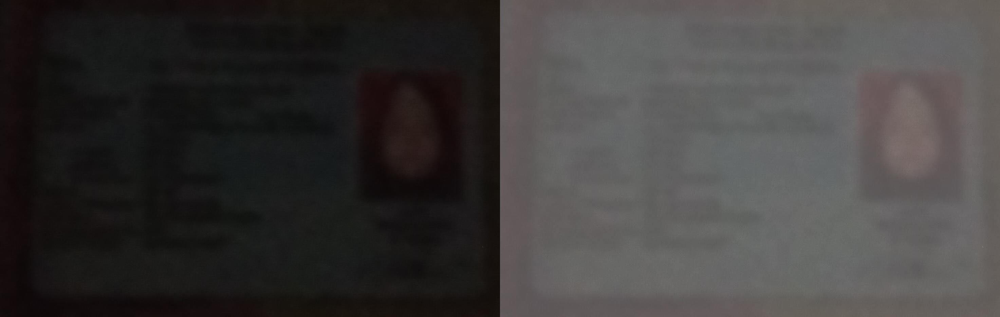

Text(0.5, 1.0, '244107020119 - brightness 78')

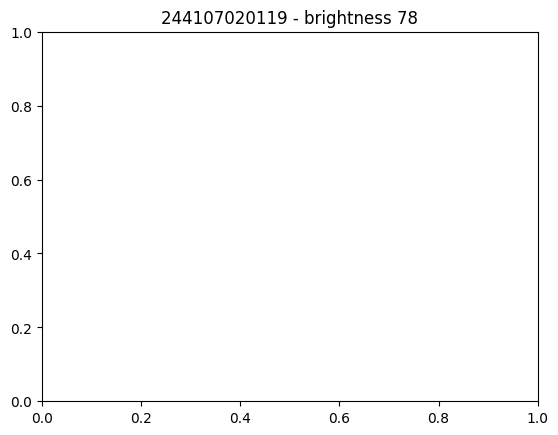

In [ ]:
#Linier Brightness

print(' Mengubah tingkat kecerahan citra ')
print('----------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

#sesuaikan dengan file dan folder di drive Anda
original = cv.imread('/content/drive/MyDrive/PCVK/KTP1A.jpeg')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per piksel
#np.clip digunakan untuk melakukan truncate pixel (nilai dibatasi antara 0-255)
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

#cara simple tanpa for loop
#brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

plt.title(NIM + ' - brightness ' + str(brightness))


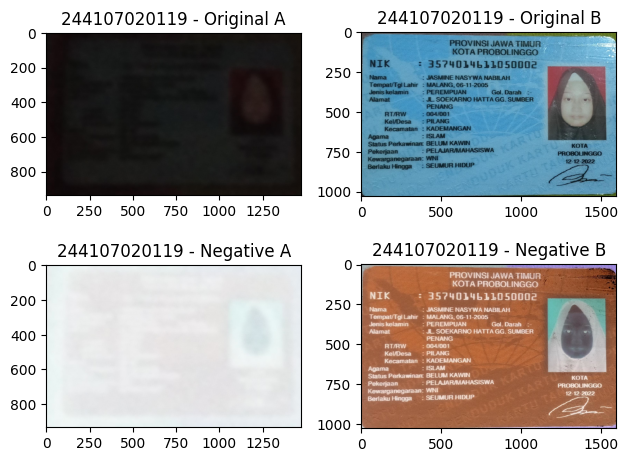

In [ ]:
#Inverse Image


image1 = cv.imread('/content/drive/MyDrive/PCVK/KTP1A.jpeg')
image2 = cv.imread('/content/drive/MyDrive/PCVK/KTP1B.jpeg')
negative = 255 - image1
negativeb = 255 - image2

image1_rgb = cv.cvtColor(image1, cv.COLOR_BGR2RGB)
image2_rgb = cv.cvtColor(image2, cv.COLOR_BGR2RGB)

negative_rgb = cv.cvtColor(negative, cv.COLOR_BGR2RGB)
negativeb_rgb = cv.cvtColor(negativeb, cv.COLOR_BGR2RGB)

plt.subplot(2, 2, 1)
plt.imshow(image1_rgb)
plt.title(NIM + ' - Original A')

plt.subplot(2, 2, 2)
plt.imshow(image2_rgb)
plt.title(NIM + ' - Original B')

plt.subplot(2, 2, 3)
plt.imshow(negative_rgb)
plt.title(NIM + ' - Negative A')

plt.subplot(2, 2, 4)
plt.imshow(negativeb_rgb)
plt.title(NIM + ' - Negative B')

plt.tight_layout()
plt.show()


 Mengubah tingkat kecerahan citra 
----------------------------------
Masukkan nilai kecerahan: 78
Masukkan nilai contrast: 1.2


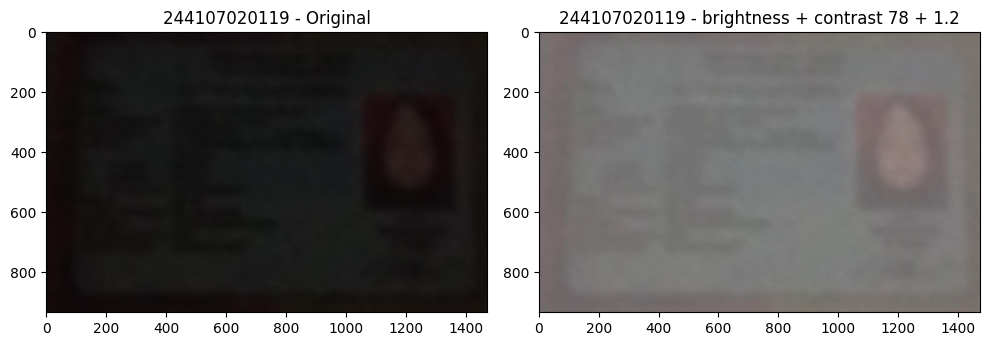

In [ ]:
#Linier Brightness dan Contrast

print(' Mengubah tingkat kecerahan citra ')
print('----------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

try:
    contrast = float(input('Masukkan nilai contrast: '))
except ValueError:
    print('Error, not a number')

#sesuaikan dengan file dan folder di drive Anda
original = cv.imread('/content/drive/MyDrive/PCVK/KTP1A.jpeg')
brightness_image = np.zeros(original.shape, original.dtype)
contrast_image = np.zeros(original.shape, original.dtype)

#akses per piksel
#np.clip digunakan untuk melakukan truncate pixel (nilai dibatasi antara 0-255)
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)


#contrast
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            contrast_image[y,x,c] = np.clip(
                brightness_image[y,x,c] * contrast, 0, 255
            )

#cara simple tanpa for loop
#brightness_image = cv.convertScaleAbs(original, beta=brightness)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - Original')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(contrast_image, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - brightness + contrast ' + str(brightness) + ' + ' +  str(contrast))

plt.tight_layout()
plt.show()



Mengubah tingkat kecerahan citra secara logaritmik
-----------------------------------------------
Masukkan nilai c: 49


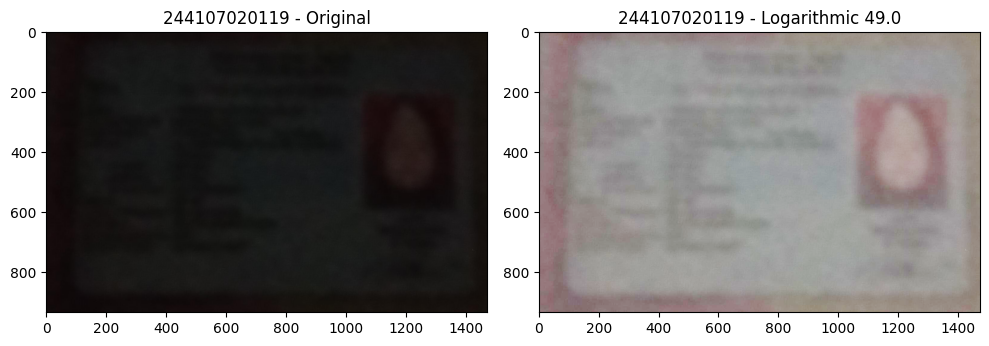

In [ ]:
#Logaritmik brightnes
print('Mengubah tingkat kecerahan citra secara logaritmik')
print('-----------------------------------------------')

try:
    c = float(input('Masukkan nilai c: '))
except ValueError:
    print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/KTP1A.jpeg')

log_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for ch in range(original.shape[2]):
            log_image[y, x, ch] = np.clip(
                c * np.log(1 + original[y, x, ch]),
                0, 255
            )

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - Original')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(log_image, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - Logarithmic ' + str(c))

plt.tight_layout()
plt.show()

Berdasarkan hasil pengamatan, Logaritmic brightness lebih menaikkan value warna sehingga warna yang pudar bisa lebih terlihat selain itu noise juga lebih terlihat pada logaritmic brightness daripada linear brightness. Kemudian perihal keterbacaan, karena hasil kamera yang buruk sehingga hasil foto originalnya blur sehingga hasil pemrosesan juga blur dan tidak ada yang bisa di baca dari kedua hasil.

# Gray Scale

Mengubah citra RGB menjadi grayscale dengan averaging
---------------------------------------------------


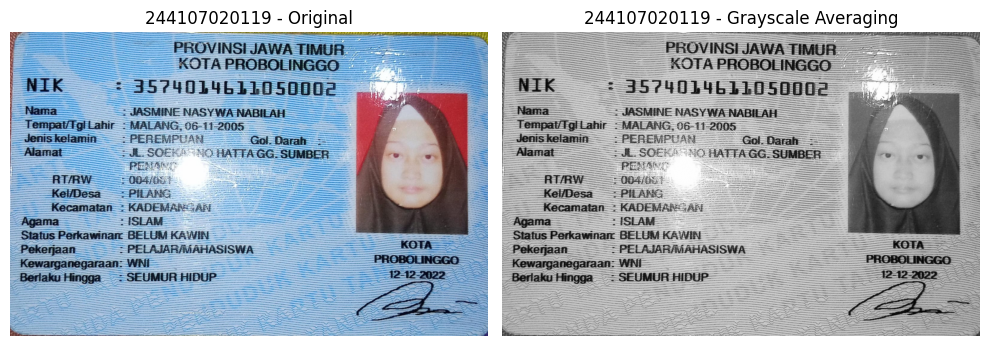

In [ ]:
#Averaging

print('Mengubah citra RGB menjadi grayscale dengan averaging')
print('---------------------------------------------------')

original = cv.imread('/content/drive/MyDrive/PCVK/KTP1C.jpeg')

gray_image = np.zeros(
    (original.shape[0], original.shape[1]),
    dtype=np.uint8
)

# Averaging
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        B = original[y, x, 0]
        G = original[y, x, 1]
        R = original[y, x, 2]

        gray_image[y, x] = (int(B) + int(G) + int(R)) / 3

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gray_image, cmap='gray')
plt.title(NIM + ' - Grayscale Averaging')
plt.axis('off')

plt.tight_layout()
plt.show()

Mengubah citra RGB menjadi grayscale dengan lightness
--------------------------------------------------


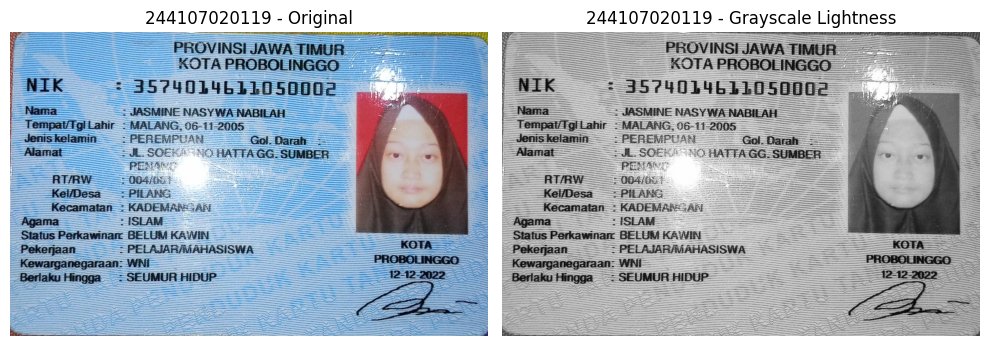

In [ ]:
#Lightness

print('Mengubah citra RGB menjadi grayscale dengan lightness')
print('--------------------------------------------------')

original = cv.imread('/content/drive/MyDrive/PCVK/KTP1C.jpeg')

lightness_image = np.zeros(
    (original.shape[0], original.shape[1]),
    dtype=np.uint8
)

# Lightness
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        B = original[y, x, 0]
        G = original[y, x, 1]
        R = original[y, x, 2]

        lightness_image[y, x] = (
            int(max(B, G, R)) + int(min(B, G, R))
        ) / 2

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(lightness_image, cmap='gray')
plt.title(NIM + ' - Grayscale Lightness')
plt.axis('off')

plt.tight_layout()
plt.show()

Mengubah citra RGB menjadi grayscale dengan luminance
--------------------------------------------------


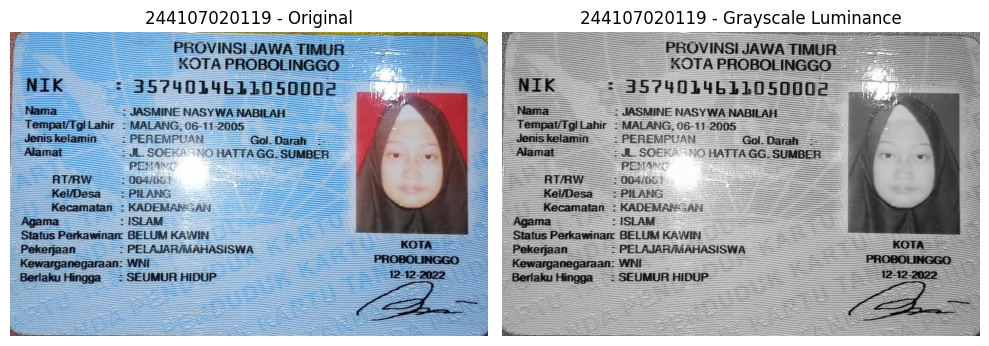

In [ ]:
#Luminance

print('Mengubah citra RGB menjadi grayscale dengan luminance')
print('--------------------------------------------------')

original = cv.imread('/content/drive/MyDrive/PCVK/KTP1C.jpeg')

luminance_image = np.zeros(
    (original.shape[0], original.shape[1]),
    dtype=np.uint8
)

# Luminance
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        B = original[y, x, 0]
        G = original[y, x, 1]
        R = original[y, x, 2]

        luminance_image[y, x] = np.clip(
            0.114 * B + 0.587 * G + 0.299 * R,
            0,
            255
        )

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
plt.title(NIM + ' - Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(luminance_image, cmap='gray')
plt.title(NIM + ' - Grayscale Luminance')
plt.axis('off')

plt.tight_layout()
plt.show()

Ketiganya memiliki hasil grayscale yang hampir sama, sehingga keterbacaan dari mata manusia terlihat sama.

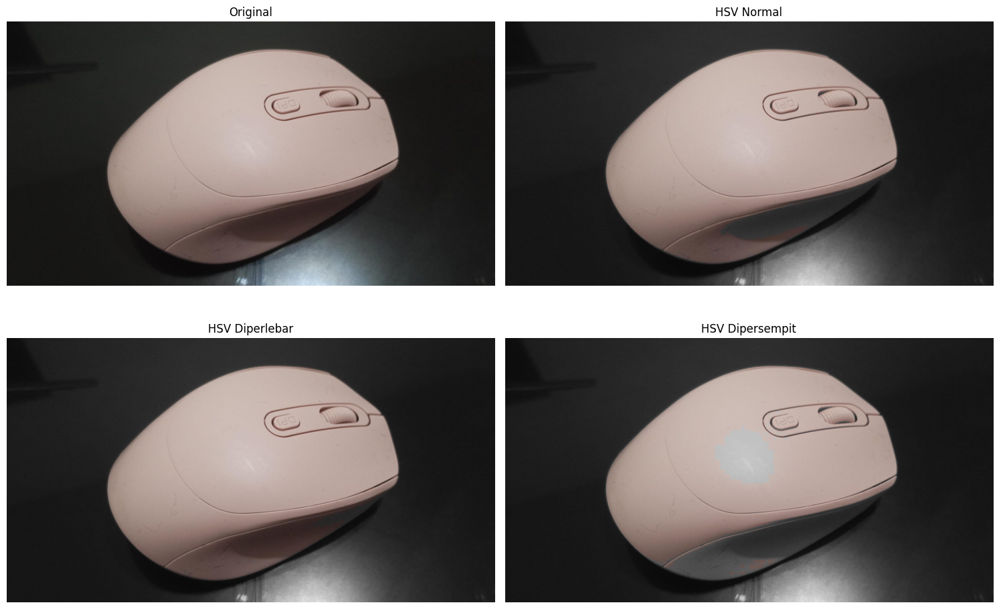

In [5]:

image = cv.imread('/content/drive/MyDrive/PCVK/OBJ1.jpeg')
hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)

gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

# grayscale menjadi 3 channel
gray_bgr = cv.cvtColor(gray, cv.COLOR_GRAY2BGR)


#HSV normal

lower_normal = np.array([0, 20, 70])
upper_normal = np.array([15, 100, 255])

mask_normal = cv.inRange(
    hsv,
    lower_normal,
    upper_normal
)

result_normal = np.where(
    mask_normal[:, :, np.newaxis] > 0,
    image,
    gray_bgr
)


#HSV diperlebar

lower_wide = np.array([0, 10, 50])
upper_wide = np.array([20, 130, 255])

mask_wide = cv.inRange(
    hsv,
    lower_wide,
    upper_wide
)

result_wide = np.where(
    mask_wide[:, :, np.newaxis] > 0,
    image,
    gray_bgr
)


#HSV dipersempit

lower_narrow = np.array([2, 30, 100])
upper_narrow = np.array([12, 80, 230])

mask_narrow = cv.inRange(
    hsv,
    lower_narrow,
    upper_narrow
)

result_narrow = np.where(
    mask_narrow[:, :, np.newaxis] > 0,
    image,
    gray_bgr
)



plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.title('Original')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(cv.cvtColor(result_normal, cv.COLOR_BGR2RGB))
plt.title('HSV Normal')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(cv.cvtColor(result_wide, cv.COLOR_BGR2RGB))
plt.title('HSV Diperlebar')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(cv.cvtColor(result_narrow, cv.COLOR_BGR2RGB))
plt.title('HSV Dipersempit')
plt.axis('off')

plt.tight_layout()
plt.show()

Apabila diperlebar maka warna yang hampir mendekati pink akan diklasifikasikan sebagai pink apabila di persempit maka seleksi warna pink akan lebih ketat seehingga lebih banyak pixel menjadi gray scale

Gamma Correction pada citra
----------------------------------
Masukkan nilai Gamma: 0.4


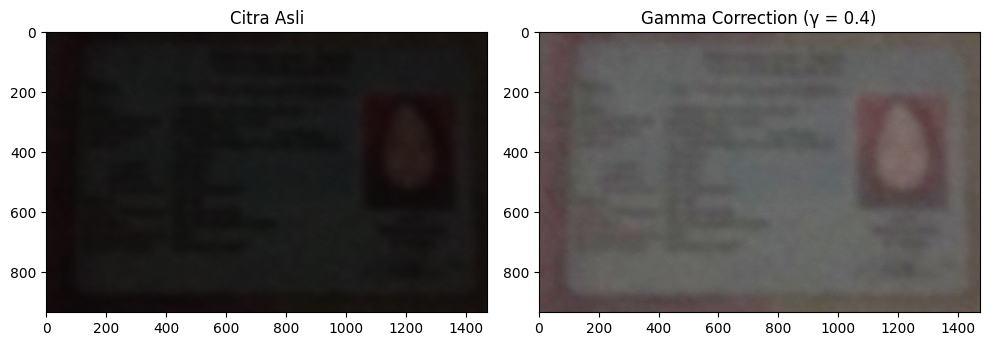

In [13]:
#Gamma

print('Gamma Correction pada citra')
print('----------------------------------')

try:
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, not a number')

image = cv.imread('/content/drive/MyDrive/PCVK/KTP1A.jpeg')

#Gamma correction
normalized = image / 255.0
gamma_image = 255 * (normalized ** gamma)
gamma_image = np.clip(gamma_image, 0, 255).astype(np.uint8)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.title('Citra Asli')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(gamma_image, cv.COLOR_BGR2RGB))
plt.title('Gamma Correction (γ = ' + str(gamma) + ')')

plt.tight_layout()
plt.show()

Urutan nilai Gamma yang saya coba adalah sebagai berikut 0.8, 0.5,0.2 kemudian 0.2 terlalu terang menurut saya sehingga saya mencoba nilai di sekitar 0.5, saya mencoba nilai 0.4 kemudian 0.6 dan saya menemukan hasil terbaik pada 0.4 karena warna nampak paling jelas pada nilai tersebut. 1.65 tidak dapat menghasilkan hasil yang baik karena foto menjadi semakin gelap.

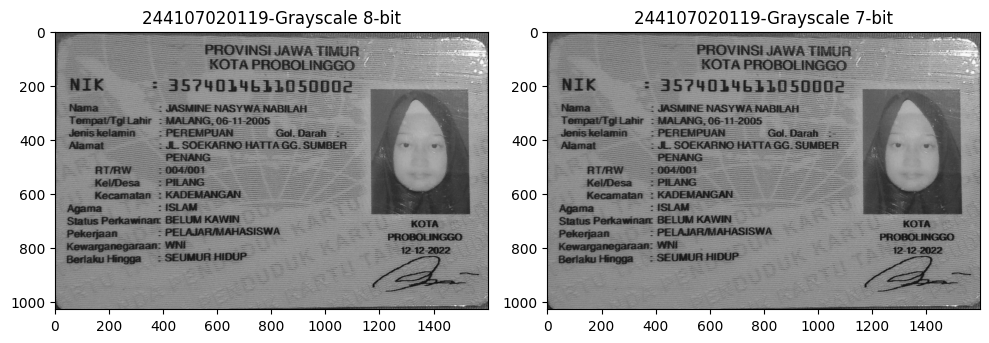

In [15]:
#Image Depth

bit_depth = 7
level = 255 / (pow(2, bit_depth) - 1)

original = cv.imread('/content/drive/MyDrive/PCVK/KTP1B.jpeg',cv.IMREAD_GRAYSCALE)


depth_image = np.round(original / level) * level
depth_image = np.clip(depth_image, 0, 255)
depth_image = depth_image.astype(np.uint8)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(original, cmap='gray')
plt.title(NIM + '-Grayscale 8-bit')

plt.subplot(1, 2, 2)
plt.imshow(depth_image, cmap='gray')
plt.title(NIM + '-Grayscale 7-bit')

plt.tight_layout()
plt.show()

Average 10 citra: PSNR = 19.74 dB
Average 20 citra: PSNR = 19.84 dB
Average 40 citra: PSNR = 19.89 dB
Average 80 citra: PSNR = 19.92 dB
Average 100 citra: PSNR = 19.92 dB


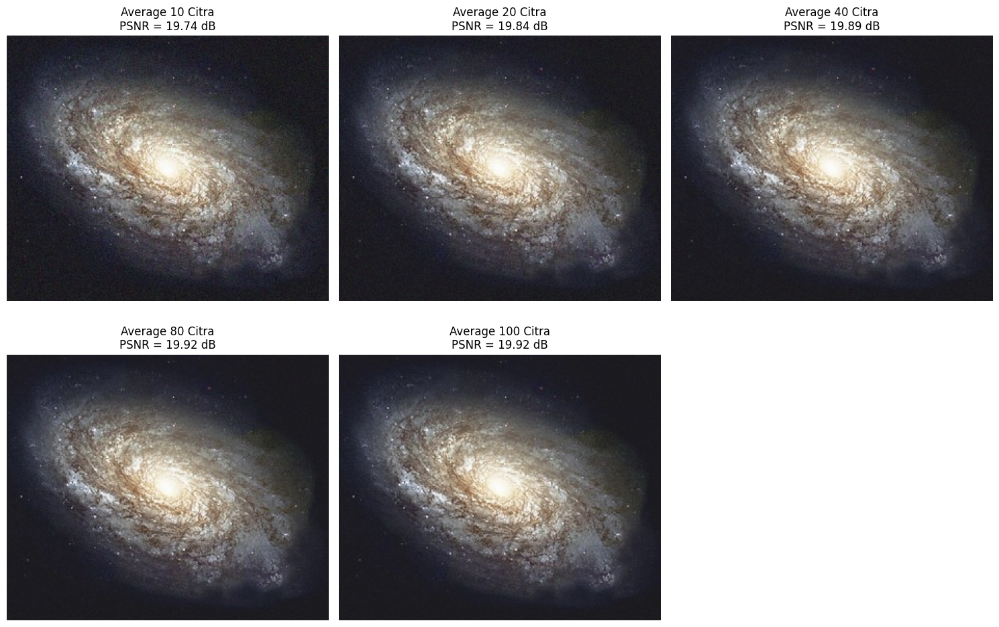

In [5]:
#PSNR


import glob
original = cv.imread(
    '/content/drive/MyDrive/PCVK/galaxy.jpg'
)

# Membaca semua citra noise
cv_img = []

for img in sorted(glob.glob(
    '/content/drive/MyDrive/PCVK/noises/*.jpg'
)):
    n = cv.imread(img)
    cv_img.append(n)

jumlah_average = [10, 20, 40, 80, 100]

hasil = []
psnr = []

for jumlah in jumlah_average:

    # Mengambil sejumlah citra noise
    images = cv_img[:jumlah]

    # Menghitung rata-rata citra
    average_image = np.mean(images, axis=0)
    average_image = np.clip(average_image, 0, 255).astype(np.uint8)

    # Menghitung PSNR terhadap citra asli
    nilai_psnr = cv.PSNR(original, average_image)

    hasil.append(average_image)
    psnr.append(nilai_psnr)

    print(f'Average {jumlah} citra: PSNR = {nilai_psnr:.2f} dB')


plt.figure(figsize=(15, 10))

for i in range(len(jumlah_average)):

    plt.subplot(2, 3, i + 1)

    plt.imshow(cv.cvtColor(hasil[i], cv.COLOR_BGR2RGB))
    plt.title(
        f'Average {jumlah_average[i]} Citra\n'
        f'PSNR = {psnr[i]:.2f} dB'
    )
    plt.axis('off')

plt.tight_layout()
plt.show()

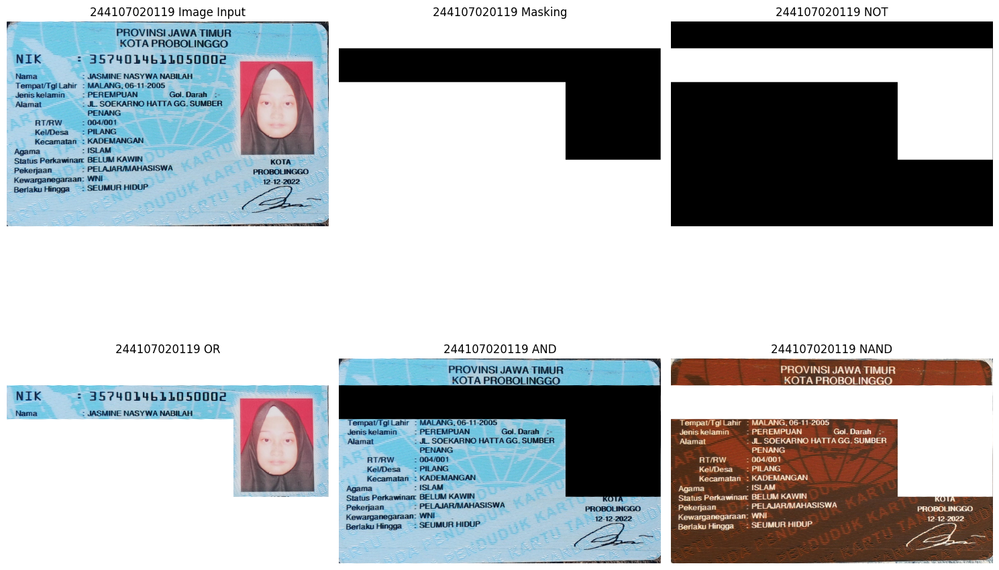

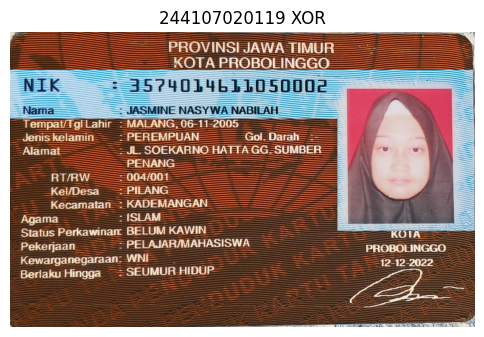

In [24]:
#Masking

image = cv.imread(
    '/content/drive/MyDrive/PCVK/KTP1D.jpeg'
)

mask = cv.imread(
    '/content/drive/MyDrive/PCVK/masking.png',
    cv.IMREAD_GRAYSCALE
)

mask = cv.resize(
    mask,
    (image.shape[1], image.shape[0])
)

# Memastikan mask benar-benar biner
_, mask = cv.threshold(
    mask, 127, 255, cv.THRESH_BINARY
)

# Mengubah mask menjadi 3 channel
mask_bgr = cv.cvtColor(mask, cv.COLOR_GRAY2BGR)


# OPERATOR LOGIKA
# =========================

# NOT
hasil_not = cv.bitwise_not(mask_bgr)

# OR
hasil_or = cv.bitwise_or(image, mask_bgr)

# AND
hasil_and = cv.bitwise_and(image, mask_bgr)

# NAND = NOT(AND)
hasil_nand = cv.bitwise_not(
    cv.bitwise_and(image, mask_bgr)
)

# XOR
hasil_xor = cv.bitwise_xor(image, mask_bgr)



plt.figure(figsize=(15, 12))

plt.subplot(2, 3, 1)
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.title(NIM + ' Image Input')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(mask, cmap='gray')
plt.title(NIM + ' Masking')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv.cvtColor(hasil_not, cv.COLOR_BGR2RGB))
plt.title(NIM + ' NOT')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv.cvtColor(hasil_or, cv.COLOR_BGR2RGB))
plt.title(NIM + ' OR')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv.cvtColor(hasil_and, cv.COLOR_BGR2RGB))
plt.title(NIM + ' AND')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(cv.cvtColor(hasil_nand, cv.COLOR_BGR2RGB))
plt.title(NIM + ' NAND')
plt.axis('off')

plt.tight_layout()
plt.show()

plt.figure(figsize=(6, 5))
plt.imshow(cv.cvtColor(hasil_xor, cv.COLOR_BGR2RGB))
plt.title(NIM + ' XOR')
plt.axis('off')
plt.show()

In [6]:
#saya menghitung koordinatnya karena saya salah baca dan membuat maskingnya di canva
mask = cv.imread('/content/drive/MyDrive/PCVK/masking.png', cv.IMREAD_GRAYSCALE)

# Binarisasi
_, binary = cv.threshold(mask, 127, 255, cv.THRESH_BINARY)

# Cari objek putih yang terpisah
num_labels, labels, stats, centroids = cv.connectedComponentsWithStats(
    binary,
    connectivity=8
)

print("Ukuran masking:", binary.shape)
print("\nKoordinat area putih:")

for i in range(1, num_labels):  # 0 = background hitam
    x = stats[i, cv.CC_STAT_LEFT]
    y = stats[i, cv.CC_STAT_TOP]
    w = stats[i, cv.CC_STAT_WIDTH]
    h = stats[i, cv.CC_STAT_HEIGHT]

    print(
        f"Area {i}: "
        f"x1={x}, y1={y}, "
        f"x2={x+w-1}, y2={y+h-1}, "
        f"width={w}, height={h}"
    )

Ukuran masking: (1000, 1575)

Koordinat area putih:
Area 1: x1=0, y1=0, x2=1574, y2=999, width=1575, height=1000


       TRANSFORMASI KECERAHAN CITRA
Masukkan nilai c untuk Logarithmic: 25
Masukkan nilai brightness: 60
Masukkan nilai contrast: 1.2
Masukkan nilai gamma: 0.4


/tmp/ipykernel_18246/822758600.py:65: RuntimeWarning: overflow encountered in scalar add
  original[y, x, ch] + brightness,


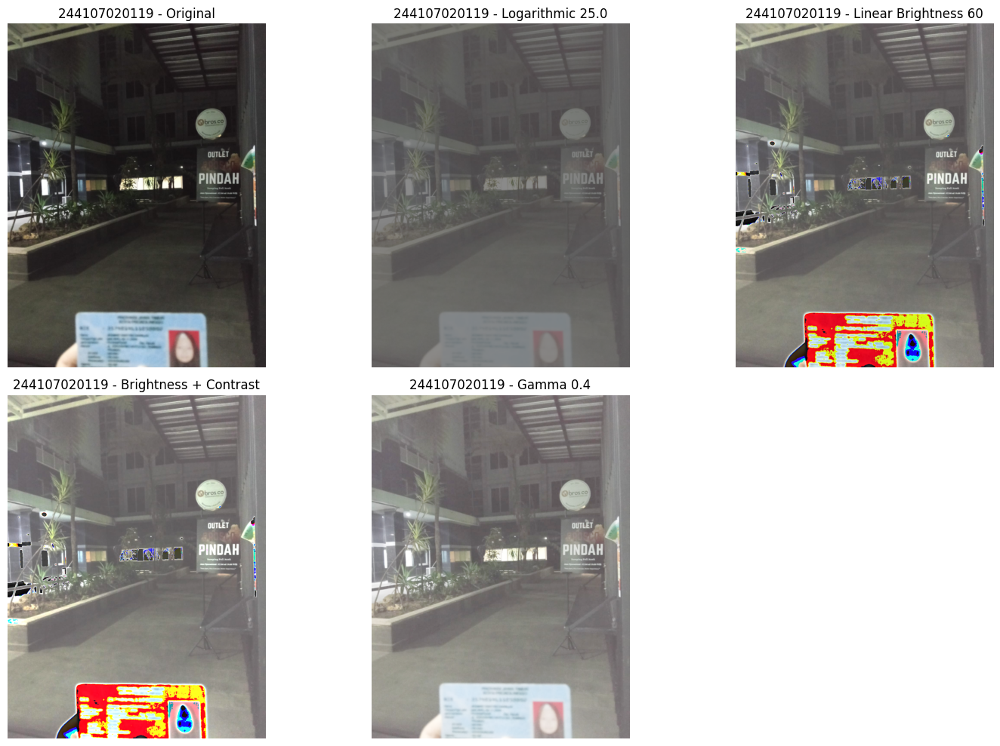

In [11]:
# foto malam hari


print('       TRANSFORMASI KECERAHAN CITRA')
print('===============================================')

# ===============================================
# INPUT
# ===============================================

try:
    c = float(input('Masukkan nilai c untuk Logarithmic: '))
    brightness = int(input('Masukkan nilai brightness: '))
    contrast = float(input('Masukkan nilai contrast: '))
    gamma = float(input('Masukkan nilai gamma: '))

except ValueError:
    print('Error, input harus berupa angka')


# ===============================================
# MEMBACA CITRA
# ===============================================

original = cv.imread(
    '/content/drive/MyDrive/PCVK/NIGHT1.jpeg'
)


# ===============================================
# 1. LOGARITHMIC BRIGHTNESS
# ===============================================

log_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for ch in range(original.shape[2]):

            r = float(original[y, x, ch])

            log_image[y, x, ch] = np.clip(
                c * np.log(1 + r),
                0, 255
            )


# ===============================================
# 2. LINEAR BRIGHTNESS
# ===============================================

brightness_image = np.zeros(
    original.shape,
    original.dtype
)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for ch in range(original.shape[2]):

            brightness_image[y, x, ch] = np.clip(
              r + brightness,0,255)


# ===============================================
# 3. LINEAR BRIGHTNESS + CONTRAST
# ===============================================

contrast_image = np.zeros(
    original.shape,
    original.dtype
)

for y in range(brightness_image.shape[0]):
    for x in range(brightness_image.shape[1]):
        for ch in range(brightness_image.shape[2]):

            contrast_image[y, x, ch] = np.clip(
                brightness_image[y, x, ch] * contrast,
                0, 255
            )


# ===============================================
# 4. GAMMA CORRECTION
# ===============================================

gamma_image = np.zeros(
    original.shape,
    original.dtype
)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for ch in range(original.shape[2]):

            r = float(original[y, x, ch]) / 255.0

            gamma_image[y, x, ch] = np.clip(
                (r ** gamma) * 255,
                0, 255
            )


# ===============================================
# MENAMPILKAN HASIL
# ===============================================

plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(
    cv.cvtColor(original, cv.COLOR_BGR2RGB)
)
plt.title(NIM + ' - Original')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(
    cv.cvtColor(log_image, cv.COLOR_BGR2RGB)
)
plt.title(
    NIM + ' - Logarithmic ' + str(c)
)
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(
    cv.cvtColor(brightness_image, cv.COLOR_BGR2RGB)
)
plt.title(
    NIM + ' - Linear Brightness ' + str(brightness)
)
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(
    cv.cvtColor(contrast_image, cv.COLOR_BGR2RGB)
)
plt.title(
    NIM + ' - Brightness + Contrast'
)
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(
    cv.cvtColor(gamma_image, cv.COLOR_BGR2RGB)
)
plt.title(
    NIM + ' - Gamma ' + str(gamma)
)
plt.axis('off')

plt.tight_layout()
plt.show()

Saya memilih hasil Gamma Correction dengan nilai gamma 0,4 karena menghasilkan citra yang lebih terang dan memberikan informasi visual yang lebih jelas pada area yang sebelumnya gelap. Detail objek dan lingkungan menjadi lebih mudah terlihat dibandingkan hasil transformasi lainnya.

Masukkan nilai contrast: 1.5
Masukkan nilai gamma: 3


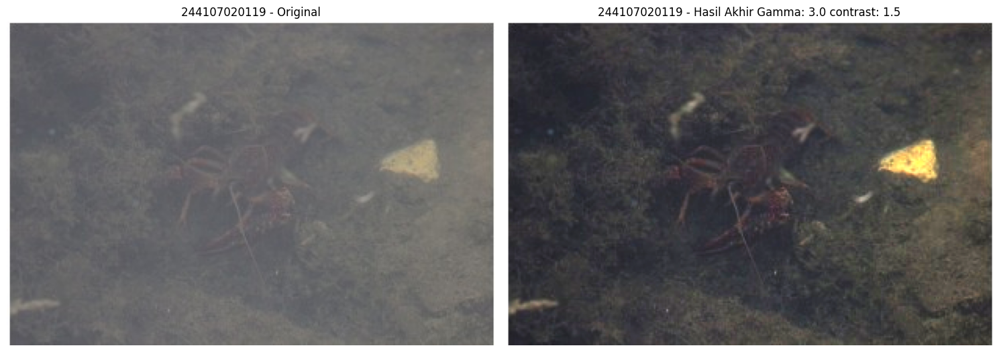

In [16]:
try:
    contrast = float(input('Masukkan nilai contrast: '))
    gamma = float(input('Masukkan nilai gamma: '))

except ValueError:
    print('Error, input harus berupa angka')

original = cv.imread(
    '/content/drive/MyDrive/PCVK/lobster1.jpeg'
)

contrast_image = np.zeros(
    original.shape,
    original.dtype
)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for ch in range(original.shape[2]):

            contrast_image[y, x, ch] = np.clip(
                original[y, x, ch] * contrast,
                0, 255
            )


gamma_image = np.zeros(
    original.shape,
    original.dtype
)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for ch in range(original.shape[2]):

            r = float(contrast_image[y, x, ch]) / 255.0

            gamma_image[y, x, ch] = np.clip(
                (r ** gamma) * 255,
                0, 255
            )


plt.figure(figsize=(15, 10))

plt.subplot(1, 2, 1)
plt.imshow(
    cv.cvtColor(original, cv.COLOR_BGR2RGB)
)
plt.title(NIM + ' - Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(
    cv.cvtColor(gamma_image, cv.COLOR_BGR2RGB)
)
plt.title(
    NIM + ' - Hasil Akhir Gamma: ' + str(gamma) + ' contrast: ' + str(contrast)
)
plt.axis('off')

plt.tight_layout()
plt.show()


1. Metode yang dipilih adalah gamma dan contrast
2. karena gambar dinilai kurang terang dan memiliki abu abu yang rata hingga gambar terasa keruh
3. Parameter awalnya menggunakan parameter dari hasil perhitungan nim kemudian menggeser secara teratur